## HCP individualized connectome prediction evaluation

In [16]:
import numpy as np
import os
import pandas as pd
import matplotlib.pyplot as plt
import scipy
import sklearn
from sklearn.decomposition import PCA
import torch
from torch.utils.data import Dataset, DataLoader
from data.data_utils import *

In [17]:
import importlib
import data.hcp_dataset
import data.dataset_utils 
import data.data_utils
importlib.reload(data.hcp_dataset)
importlib.reload(data.dataset_utils)
importlib.reload(data.data_utils)
from data.hcp_dataset import *
from data.dataset_utils import *
from data.data_utils import *
from data.hcp_dataset import HCP_Base, HCP_Partition

In [18]:
import models
from models import *
from models import CrossModalPCA
importlib.reload(models)
from models import *

import importlib
import eval
importlib.reload(eval)
from eval import *

importlib.reload(eval)
import eval
from eval import *

### PCA (FC-to-FC) Autoencoder model (256 components)

In [21]:
HCP_Dataset = HCP_Base(parcellation="Glasser", hemi="both", shuffle_seed=0, source="FC", target="FC")
print(HCP_Dataset.fc_matrices.shape)
print(HCP_Dataset.fc_upper_triangles.shape)
print(HCP_Dataset.sc_matrices.shape)      
print(HCP_Dataset.sc_upper_triangles.shape)
print(HCP_Dataset.sc_r2t_matrices.shape)

(957, 360, 360)
(957, 64620)
(957, 360, 360)
(957, 64620)
(957, 360, 66)


In [19]:
HCP_Dataset = HCP_Base(parcellation="Glasser", hemi="left", shuffle_seed=0, source="FC", target="FC")
print(HCP_Dataset.fc_matrices.shape)
print(HCP_Dataset.fc_upper_triangles.shape)
print(HCP_Dataset.sc_matrices.shape)      
print(HCP_Dataset.sc_upper_triangles.shape)
print(HCP_Dataset.sc_r2t_matrices.shape)

(957, 180, 180)
(957, 16110)
(957, 180, 180)
(957, 16110)
(957, 180, 66)


In [20]:
HCP_Dataset = HCP_Base(parcellation="Glasser", hemi="right", shuffle_seed=0, source="FC", target="FC")
print(HCP_Dataset.fc_matrices.shape)
print(HCP_Dataset.fc_upper_triangles.shape)
print(HCP_Dataset.sc_matrices.shape)      
print(HCP_Dataset.sc_upper_triangles.shape)
print(HCP_Dataset.sc_r2t_matrices.shape)

(957, 180, 180)
(957, 16110)
(957, 180, 180)
(957, 16110)
(957, 180, 66)


In [22]:
sc_matrix = HCP_Dataset.sc_matrices[0]

# Compute region-to-region correlation matrix from the r x tracts region2tract matrix
r2t = HCP_Dataset.sc_r2t_matrices[0]  # shape: r x tracts
region_corr_matrix = np.corrcoef(r2t)  # shape: r x r

/ext3/miniforge3/lib/python3.12/site-packages/numpy/lib/_function_base_impl.py:3065: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/ext3/miniforge3/lib/python3.12/site-packages/numpy/lib/_function_base_impl.py:3066: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


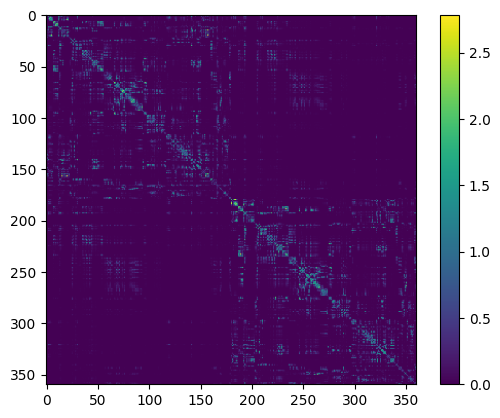

In [25]:
plt.imshow(sc_matrix)
plt.colorbar()
plt.show()

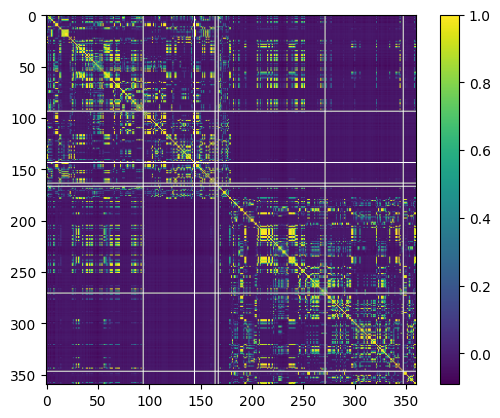

In [26]:
plt.imshow(region_corr_matrix)
plt.colorbar()
plt.show()

In [23]:
HCP_Dataset = HCP_Base(parcellation="Glasser", shuffle_seed=0, source="FC", target="FC")

# redefine dataset and loaders
HCP_train = HCP_Partition(HCP_Dataset, "train")
HCP_val = HCP_Partition(HCP_Dataset, "val")
HCP_test = HCP_Partition(HCP_Dataset, "test")
HCP_train_loader = DataLoader(HCP_train, batch_size=256, shuffle=False)
HCP_val_loader = DataLoader(HCP_val, batch_size=256, shuffle=False)
HCP_test_loader = DataLoader(HCP_test, batch_size=256, shuffle=False)

# initialize model
cross_modal_pca_model = CrossModalPCA(HCP_Dataset, num_components=256)

# generate predictions
device = cross_modal_pca_model.device if hasattr(cross_modal_pca_model, 'device') else torch.device("cpu")
train_preds, train_targets = predict_from_loader(cross_modal_pca_model, HCP_train_loader, device=device)
val_preds, val_targets = predict_from_loader(cross_modal_pca_model, HCP_val_loader, device=device)
test_preds, test_targets = predict_from_loader(cross_modal_pca_model, HCP_test_loader, device=device)

Source mean shape: torch.Size([64620])
Source loadings shape: torch.Size([64620, 683])
Target mean shape: torch.Size([64620])
Target loadings shape: torch.Size([64620, 683])


In [5]:
train_metrics = evaluate_predictions(train_preds, train_targets, HCP_Dataset.fc_train_avg)
val_metrics = evaluate_predictions(val_preds, val_targets, HCP_Dataset.fc_train_avg)
test_metrics = evaluate_predictions(test_preds, test_targets, HCP_Dataset.fc_train_avg)
print("Train metrics:", train_metrics)
print("Val metrics:", val_metrics)
print("Test metrics:", test_metrics)

Train metrics: {'pearson': np.float32(0.9624674), 'demeaned_pearson': np.float64(0.8707083099403239), 'mse': np.float32(0.003129135), 'r2': np.float32(0.74632674), 'avg_rank': np.float64(1.0), 'top1_acc': np.float64(1.0)}
Val metrics: {'pearson': np.float32(0.9115063), 'demeaned_pearson': np.float64(0.6769549985813919), 'mse': np.float32(0.007564828), 'r2': np.float32(0.4118384), 'avg_rank': np.float64(1.0), 'top1_acc': np.float64(1.0)}
Test metrics: {'pearson': np.float32(0.9129079), 'demeaned_pearson': np.float64(0.6680823575426512), 'mse': np.float32(0.007214849), 'r2': np.float32(0.40817082), 'avg_rank': np.float64(0.999947403024326), 'top1_acc': np.float64(0.9948717948717949)}


shape of C_true_scores:  (64620, 683)
shape of C_pred_scores:  (64620, 683)


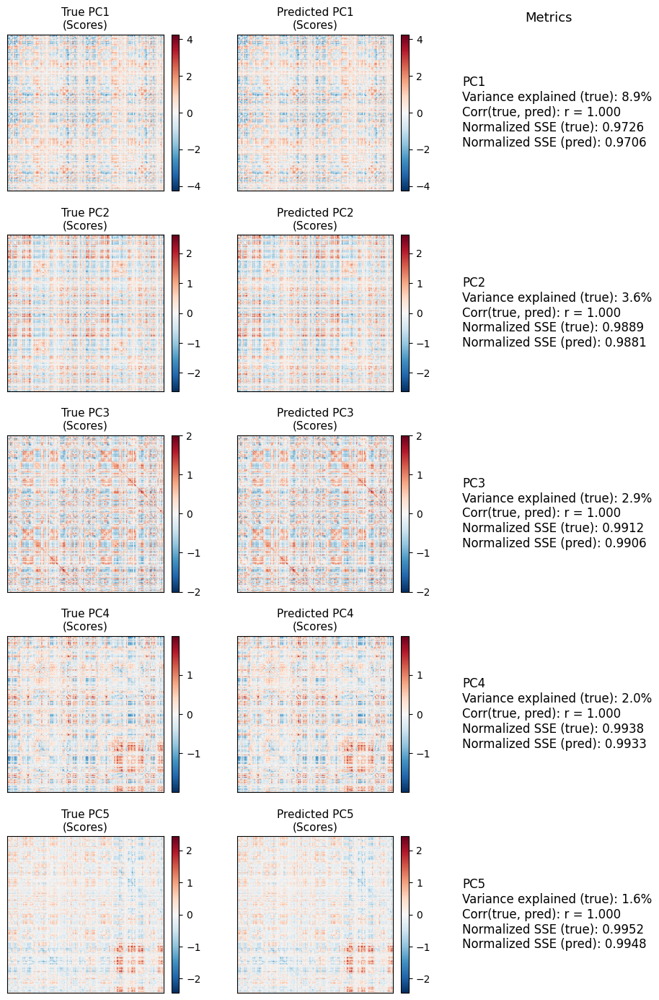

shape of C_true_scores:  (64620, 79)
shape of C_pred_scores:  (64620, 79)


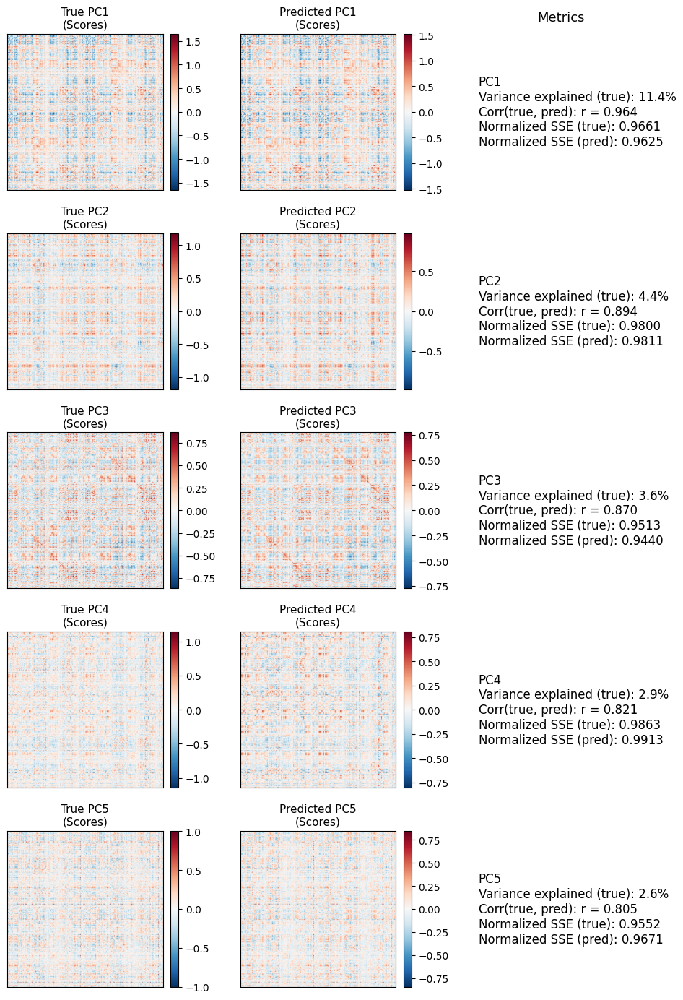

shape of C_true_scores:  (64620, 195)
shape of C_pred_scores:  (64620, 195)


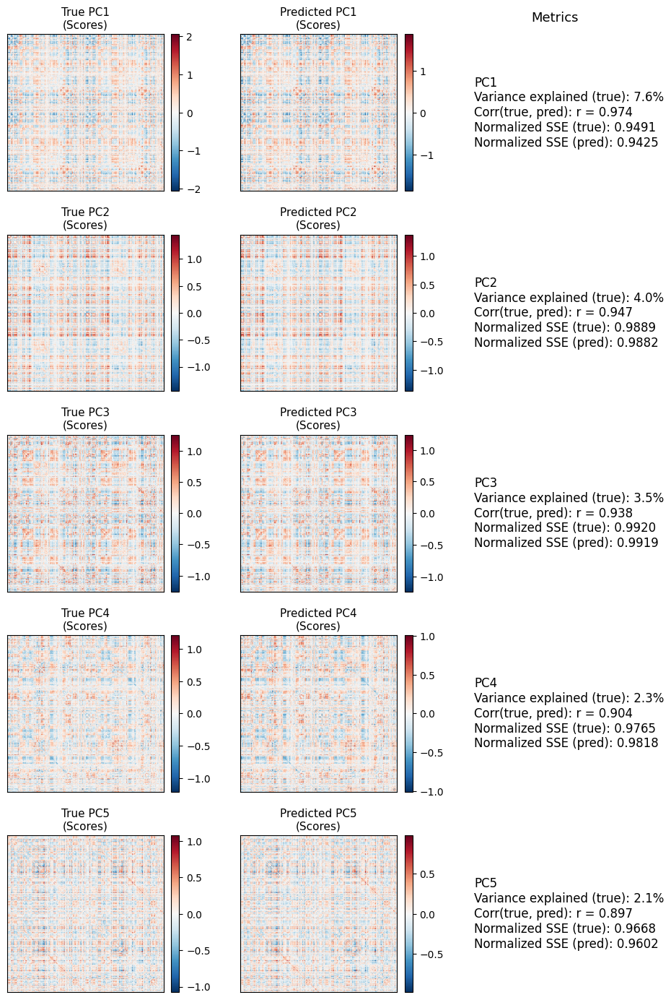

In [6]:
train_pca_preds, train_pca_targets = evaluate_pca_structure(preds=train_preds, targets=train_targets, train_mean=HCP_Dataset.fc_train_avg)
plot_pc_modes_comparison(pca_preds=train_pca_preds, pca_targets=train_pca_targets, preds=train_preds, targets=train_targets, train_mean=HCP_Dataset.fc_train_avg, numroi=360, num_pcs=5, diagval=0)

val_pca_preds, val_pca_targets = evaluate_pca_structure(preds=val_preds, targets=val_targets, train_mean=HCP_Dataset.fc_train_avg)
plot_pc_modes_comparison(pca_preds=val_pca_preds, pca_targets=val_pca_targets, preds=val_preds, targets=val_targets, train_mean=HCP_Dataset.fc_train_avg, numroi=360, num_pcs=5, diagval=0)

test_pca_preds, test_pca_targets = evaluate_pca_structure(preds=test_preds, targets=test_targets, train_mean=HCP_Dataset.fc_train_avg)
plot_pc_modes_comparison(pca_preds=test_pca_preds, pca_targets=test_pca_targets, preds=test_preds, targets=test_targets, train_mean=HCP_Dataset.fc_train_avg, numroi=360, num_pcs=5, diagval=0) 

### Cross-modal (SC-to-FC) PCA model

In [16]:
HCP_Dataset = HCP_Base(parcellation="Glasser", shuffle_seed=0, source="SC", target="FC")

# redefine dataset and loaders
HCP_train = HCP_Partition(HCP_Dataset, "train")
HCP_val = HCP_Partition(HCP_Dataset, "val")
HCP_test = HCP_Partition(HCP_Dataset, "test")
HCP_train_loader = DataLoader(HCP_train, batch_size=256, shuffle=False)
HCP_val_loader = DataLoader(HCP_val, batch_size=256, shuffle=False)
HCP_test_loader = DataLoader(HCP_test, batch_size=256, shuffle=False)

# initialize model
cross_modal_pca_model = CrossModalPCA(HCP_Dataset, num_components=256)

# generate predictions
device = cross_modal_pca_model.device if hasattr(cross_modal_pca_model, 'device') else torch.device("cpu")
train_preds, train_targets = predict_from_loader(cross_modal_pca_model, HCP_train_loader, device=device)
val_preds, val_targets = predict_from_loader(cross_modal_pca_model, HCP_val_loader, device=device)
test_preds, test_targets = predict_from_loader(cross_modal_pca_model, HCP_test_loader, device=device)

Source mean shape: torch.Size([64620])
Source loadings shape: torch.Size([64620, 683])
Target mean shape: torch.Size([64620])
Target loadings shape: torch.Size([64620, 683])


In [17]:
train_metrics = evaluate_predictions(train_preds, train_targets, HCP_Dataset.fc_train_avg)
val_metrics = evaluate_predictions(val_preds, val_targets, HCP_Dataset.fc_train_avg)
test_metrics = evaluate_predictions(test_preds, test_targets, HCP_Dataset.fc_train_avg)
print("Train metrics:", train_metrics)
print("Val metrics:", val_metrics)
print("Test metrics:", test_metrics)

Train metrics: {'pearson': np.float32(0.78404456), 'demeaned_pearson': np.float64(0.002012564295873068), 'mse': np.float32(0.01785705), 'r2': np.float32(-0.29454026), 'avg_rank': np.float64(0.5008263860455444), 'top1_acc': np.float64(0.0014641288433382138)}
Val metrics: {'pearson': np.float32(0.8046689), 'demeaned_pearson': np.float64(0.01636788228163165), 'mse': np.float32(0.016388157), 'r2': np.float32(-0.15936653), 'avg_rank': np.float64(0.5151418041980451), 'top1_acc': np.float64(0.0)}
Test metrics: {'pearson': np.float32(0.8116843), 'demeaned_pearson': np.float64(0.010410745502828245), 'mse': np.float32(0.015550734), 'r2': np.float32(-0.17462762), 'avg_rank': np.float64(0.5079289940828402), 'top1_acc': np.float64(0.005128205128205128)}


In [22]:
def plot_pca_inference_with_null(model, partition, subj_idx=None, seed=None):
    """
    Performs inference using a trained CrossModalPCA model on a random subject from the partition.
    Displays three matrices side by side:
      - Left: True target (y)
      - Middle: Predicted target (y_hat)
      - Right: Null prediction (shuffled latent z -> decoded)

    Plots both the original output and the demeaned output as two rows.

    Args:
        model: Trained CrossModalPCA model
        partition: HCP_Partition dataset (train, val, or test)
        train_mean: Mean of training targets (1D vector, used for demeaning, same shape as y)
        subj_idx: Optional subject index. If None, selects randomly.
        seed: Optional random seed for reproducibility

    Returns:
        dict with 'subj_idx', 'y_true', 'y_pred', 'y_null' (all as numpy arrays)
    """
    if seed is not None:
        np.random.seed(seed)
        torch.manual_seed(seed)

    # Select random subject if not specified
    if subj_idx is None:
        subj_idx = np.random.randint(0, len(partition))

    # Get data for this subject
    sample = partition[subj_idx]
    x = sample['x'].unsqueeze(0)  # (1, d)
    y_true = sample['y']  # (d,)

    # 1. Standard prediction: x -> z -> y_hat
    model.eval()
    with torch.no_grad():
        y_pred = model(x).squeeze(0)  # (d,)

    # 2. Null prediction: x -> z -> shuffle(z) -> y_null
    with torch.no_grad():
        x_float = x.to(model.device).to(torch.float32)
        x_centered = x_float - model.source_mean_
        z = torch.matmul(x_centered, model.source_loadings_k)  # (1, k)

        # Randomly shuffle z components
        z_shuffled = z.clone()
        perm = torch.randperm(z.shape[1], device=z.device)
        z_shuffled = z_shuffled[:, perm]

        # Decode shuffled z
        y_null = torch.matmul(z_shuffled, model.target_loadings_k.t()) + model.target_mean_
        y_null = y_null.squeeze(0)  # (d,)

    # Convert predictions to numpy
    y_true_np = y_true.cpu().numpy()
    y_pred_np = y_pred.cpu().numpy()
    y_null_np = y_null.cpu().numpy()

    # Use train_mean (could be numpy or torch)
    if isinstance(model.source_mean_, torch.Tensor):
        train_mean_np = model.target_mean_.cpu().numpy()
    else:
        train_mean_np = model.target_mean_

    # Demean all vectors by train_mean
    y_true_demeaned = y_true_np - train_mean_np
    y_pred_demeaned = y_pred_np - train_mean_np
    y_null_demeaned = y_null_np - train_mean_np

    # Compute number of ROIs from vector length
    n_edges = y_true_np.size
    n_roi = int((1 + np.sqrt(1 + 8 * n_edges)) / 2)

    # Convert to square matrices
    mat_true = tri2square(y_true_np, numroi=n_roi)
    mat_pred = tri2square(y_pred_np, numroi=n_roi)
    mat_null = tri2square(y_null_np, numroi=n_roi)

    mat_true_dm = tri2square(y_true_demeaned, numroi=n_roi)
    mat_pred_dm = tri2square(y_pred_demeaned, numroi=n_roi)
    mat_null_dm = tri2square(y_null_demeaned, numroi=n_roi)

    # Plotting
    fig, axes = plt.subplots(2, 3, figsize=(15, 10))

    # Dynamic colorbar scaling per matrix (row 0: original, row 1: demeaned)
    vmax_true = np.abs(mat_true).max()
    vmax_pred = np.abs(mat_pred).max()
    vmax_null = np.abs(mat_null).max()
    vmax_true_dm = np.abs(mat_true_dm).max()
    vmax_pred_dm = np.abs(mat_pred_dm).max()
    vmax_null_dm = np.abs(mat_null_dm).max()

    # First row: Original outputs
    im00 = axes[0, 0].imshow(mat_true, aspect='equal', cmap='RdBu_r', vmin=-vmax_true, vmax=vmax_true)
    axes[0, 0].set_title(f"True Target\nSubject {subj_idx}")
    cbar00 = fig.colorbar(im00, ax=axes[0, 0], orientation='vertical', fraction=0.046, pad=0.04)
    cbar00.set_label('True (orig)')

    im01 = axes[0, 1].imshow(mat_pred, aspect='equal', cmap='RdBu_r', vmin=-vmax_pred, vmax=vmax_pred)
    axes[0, 1].set_title(f"Predicted Target\nSubject {subj_idx}")
    cbar01 = fig.colorbar(im01, ax=axes[0, 1], orientation='vertical', fraction=0.046, pad=0.04)
    cbar01.set_label('Predicted (orig)')

    im02 = axes[0, 2].imshow(mat_null, aspect='equal', cmap='RdBu_r', vmin=-vmax_null, vmax=vmax_null)
    axes[0, 2].set_title(f"Null Prediction (shuffled c)")
    cbar02 = fig.colorbar(im02, ax=axes[0, 2], orientation='vertical', fraction=0.046, pad=0.04)
    cbar02.set_label('Null (orig)')

    # Second row: Demeaned outputs
    im10 = axes[1, 0].imshow(mat_true_dm, aspect='equal', cmap='RdBu_r', vmin=-vmax_true_dm, vmax=vmax_true_dm)
    axes[1, 0].set_title(f"True Target (demeaned)\nSubject {subj_idx}")
    cbar10 = fig.colorbar(im10, ax=axes[1, 0], orientation='vertical', fraction=0.046, pad=0.04)
    cbar10.set_label('True (demeaned)')

    im11 = axes[1, 1].imshow(mat_pred_dm, aspect='equal', cmap='RdBu_r', vmin=-vmax_pred_dm, vmax=vmax_pred_dm)
    axes[1, 1].set_title(f"Predicted Target (demeaned)\nSubject {subj_idx}")
    cbar11 = fig.colorbar(im11, ax=axes[1, 1], orientation='vertical', fraction=0.046, pad=0.04)
    cbar11.set_label('Predicted (demeaned)')

    im12 = axes[1, 2].imshow(mat_null_dm, aspect='equal', cmap='RdBu_r', vmin=-vmax_null_dm, vmax=vmax_null_dm)
    axes[1, 2].set_title(f"Null Prediction (demeaned, shuffled c)")
    cbar12 = fig.colorbar(im12, ax=axes[1, 2], orientation='vertical', fraction=0.046, pad=0.04)
    cbar12.set_label('Null (demeaned)')

    for ax in axes.flat:
        ax.set_xticks([])
        ax.set_yticks([])

    plt.tight_layout()
    plt.show()

    return {
        'subj_idx': subj_idx,
        'z': z,
        'z_shuffled': z_shuffled,
        'y_true': y_true_np,
        'y_pred': y_pred_np,
        'y_null': y_null_np,
        'mat_true': mat_true,
        'mat_pred': mat_pred,
        'mat_null': mat_null,
        'mat_true_demeaned': mat_true_dm,
        'mat_pred_demeaned': mat_pred_dm,
        'mat_null_demeaned': mat_null_dm
    }

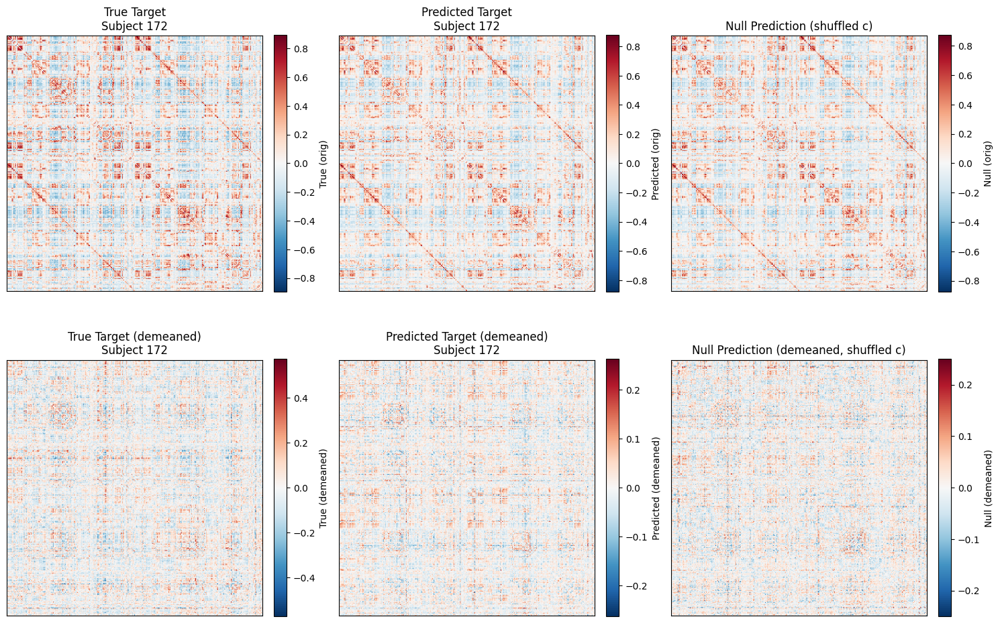

In [23]:
results = plot_pca_inference_with_null(cross_modal_pca_model, HCP_test, subj_idx=None, seed=0)

In [26]:
z = results['z']
print("Mean:", z.mean().item())
print("Variance:", z.var().item())
z

Mean: -0.016468076035380363
Variance: 0.4953519403934479


tensor([[-6.2179e-01,  2.9405e+00, -1.8846e+00, -1.1483e+00,  7.6017e-01,
          7.7607e-01,  5.9008e-01,  2.2972e+00, -6.2461e-01, -8.0139e-01,
          2.2484e-01,  1.3536e+00,  1.4216e+00, -4.3794e-01,  7.5925e-01,
         -2.4084e-01, -7.0375e-01, -1.0538e-02, -2.2159e-01,  9.7149e-01,
         -1.0290e+00, -8.1941e-01,  1.1568e+00, -1.1069e+00, -1.4875e+00,
          2.9648e-01, -4.4762e-01, -3.0362e-01,  2.4846e-01,  7.0479e-01,
          5.7660e-01,  1.4621e-01, -7.3105e-01,  6.3979e-01, -1.1952e+00,
         -2.0731e+00,  3.2043e-03, -8.2972e-01,  1.1132e+00, -2.6208e+00,
         -4.2607e-01,  5.7420e-01,  9.5072e-01,  5.4365e-01, -1.2182e+00,
         -3.3597e-01, -1.1731e-01, -1.2032e+00, -1.0015e+00, -1.1931e+00,
          6.3277e-01,  5.5877e-01,  6.1317e-01,  4.0143e-01, -4.8302e-01,
          3.7475e-01,  1.0773e+00,  1.6168e+00,  1.0901e+00,  6.8227e-01,
         -2.1486e+00, -2.7894e-01,  7.2226e-01,  1.8559e+00,  1.2971e-01,
         -2.7824e-01, -9.7363e-02, -6.

shape of C_true_scores:  (64620, 683)
shape of C_pred_scores:  (64620, 683)


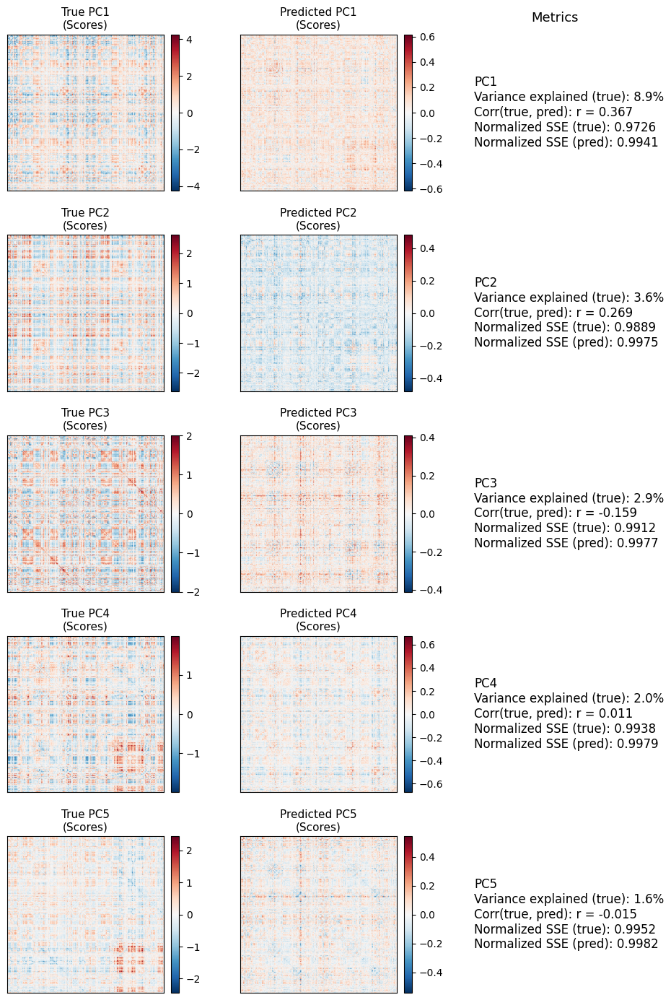

shape of C_true_scores:  (64620, 79)
shape of C_pred_scores:  (64620, 79)


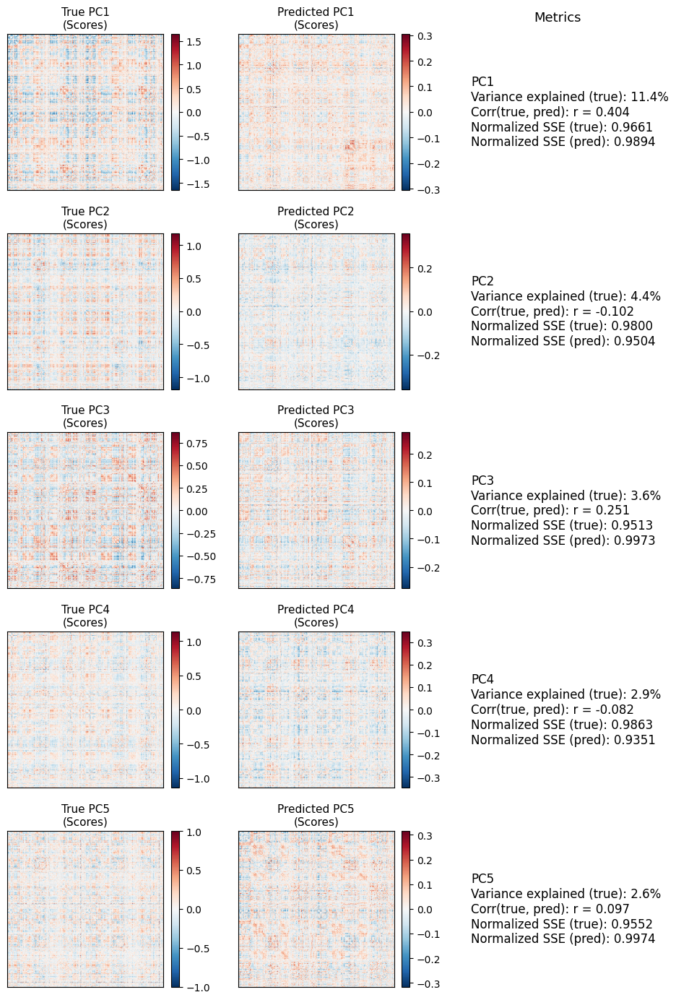

shape of C_true_scores:  (64620, 195)
shape of C_pred_scores:  (64620, 195)


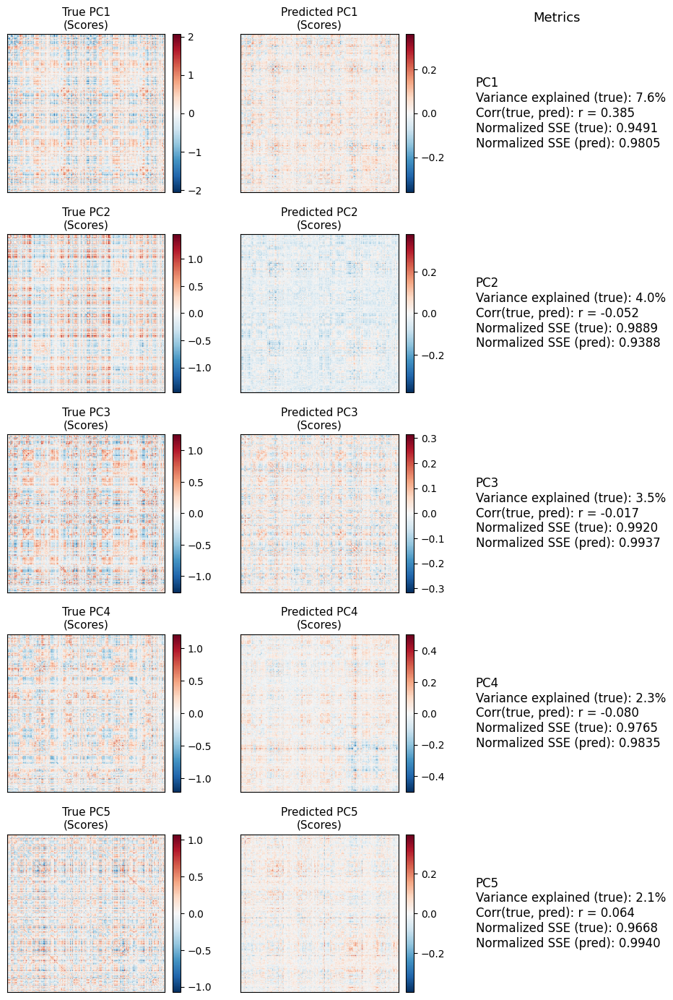

In [19]:
train_pca_preds, train_pca_targets = evaluate_pca_structure(preds=train_preds, targets=train_targets, train_mean=HCP_Dataset.fc_train_avg)
plot_pc_modes_comparison(pca_preds=train_pca_preds, pca_targets=train_pca_targets, preds=train_preds, targets=train_targets, train_mean=HCP_Dataset.fc_train_avg, numroi=360, num_pcs=5, diagval=0)

val_pca_preds, val_pca_targets = evaluate_pca_structure(preds=val_preds, targets=val_targets, train_mean=HCP_Dataset.fc_train_avg)
plot_pc_modes_comparison(pca_preds=val_pca_preds, pca_targets=val_pca_targets, preds=val_preds, targets=val_targets, train_mean=HCP_Dataset.fc_train_avg, numroi=360, num_pcs=5, diagval=0)

test_pca_preds, test_pca_targets = evaluate_pca_structure(preds=test_preds, targets=test_targets, train_mean=HCP_Dataset.fc_train_avg)
plot_pc_modes_comparison(pca_preds=test_pca_preds, pca_targets=test_pca_targets, preds=test_preds, targets=test_targets, train_mean=HCP_Dataset.fc_train_avg, numroi=360, num_pcs=5, diagval=0) 

### Cross-modal (SC-to-FC) Krakencoder model

In [22]:
from scipy.io import loadmat

# --- Load predicted .mat and set source parcellation/conn type ---
parcellation = 'Glasser'
conn_type = 'SC' # Source conn type

### TRUE DATA
mat = loadmat('./krakencoder/example_data/mydata_Glasser_inputs.mat')
conndata_Glasser = {}
for ckey in ['FCcorr_Glasser_hpf', 'SCifod2act_Glasser_volnorm']:
    cell_array = mat[ckey]['data'][0][0][0]  # shape: (1, 957), each cell is 360x360
    nsubj = cell_array.shape[0]
    arr3d = np.stack([cell_array[i] for i in range(nsubj)], axis=0)  # (957, 360, 360)

    # Flatten each subject's matrix into upper triangle (excluding diagonal) using square2tri
    data_tri = np.stack([square2tri(arr3d[i], k=1) for i in range(arr3d.shape[0])], axis=0)  # (957, n_edges)
    conndata_Glasser[ckey] = {'data': data_tri}
    print("conndata[%r]['data'] shape:" % ckey, conndata_Glasser[ckey]['data'].shape)

### KRAKEN PREDICTIONS
matfile = loadmat(f"./krakencoder/example_data/mydata_kraken_source_{parcellation}.{conn_type}.mat")
outputtypes = matfile['outputtypes']
predicted_alltypes = matfile['predicted_alltypes']

headers = [
    'FCcorr_Glasser_hpf',
    'FCcorr_4S456Parcels_hpf',
    'SCifod2act_Glasser_volnorm',
    'SCifod2act_4S456Parcels_volnorm'
]

preds = predicted_alltypes[0][0][0][0][0]

# Grab Glasser predictions
predicted_alltypes_Glasser = {
    'FCcorr_Glasser_hpf':    {'data': np.array(preds[1])},
    'SCifod2act_Glasser_volnorm': {'data': np.array(preds[3])}
}

kraken_preds = predicted_alltypes_Glasser['FCcorr_Glasser_hpf']['data']
kraken_train_preds = kraken_preds[HCP_Dataset.trainvaltest_partition_indices['train']]
kraken_val_preds = kraken_preds[HCP_Dataset.trainvaltest_partition_indices['val']]
kraken_test_preds = kraken_preds[HCP_Dataset.trainvaltest_partition_indices['test']]

conndata['FCcorr_Glasser_hpf']['data'] shape: (957, 64620)
conndata['SCifod2act_Glasser_volnorm']['data'] shape: (957, 64620)


In [23]:
train_metrics = evaluate_predictions(kraken_train_preds, train_targets, HCP_Dataset.fc_train_avg)
val_metrics = evaluate_predictions(kraken_val_preds, val_targets, HCP_Dataset.fc_train_avg)
test_metrics = evaluate_predictions(kraken_test_preds, test_targets, HCP_Dataset.fc_train_avg)
print("Train metrics:", train_metrics)
print("Val metrics:", val_metrics)
print("Test metrics:", test_metrics)

Train metrics: {'pearson': np.float32(0.8686155), 'demeaned_pearson': np.float64(0.5224024613943099), 'mse': np.float32(0.0110131195), 'r2': np.float32(0.18636581), 'avg_rank': np.float64(0.8466223212122901), 'top1_acc': np.float64(0.21815519765739386)}
Val metrics: {'pearson': np.float32(0.82622266), 'demeaned_pearson': np.float64(0.06635177203543155), 'mse': np.float32(0.014707321), 'r2': np.float32(-0.045225456), 'avg_rank': np.float64(0.5566415638519469), 'top1_acc': np.float64(0.0379746835443038)}
Test metrics: {'pearson': np.float32(0.8358165), 'demeaned_pearson': np.float64(0.0828890716045415), 'mse': np.float32(0.013571207), 'r2': np.float32(-0.031421516), 'avg_rank': np.float64(0.5659960552268244), 'top1_acc': np.float64(0.015384615384615385)}


shape of C_true_scores:  (64620, 683)
shape of C_pred_scores:  (64620, 683)


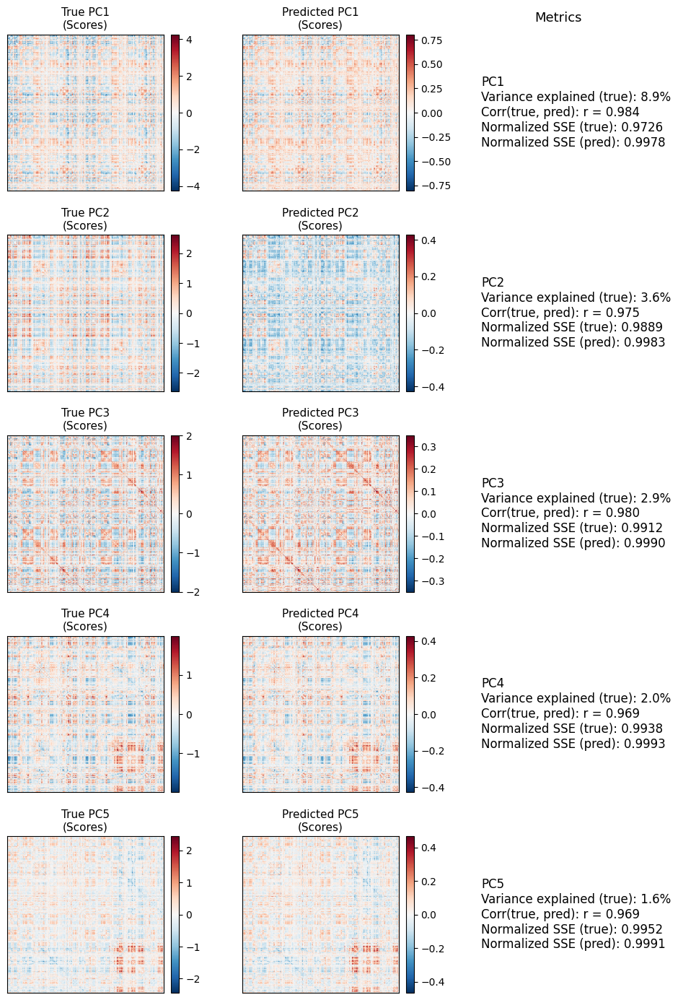

shape of C_true_scores:  (64620, 79)
shape of C_pred_scores:  (64620, 79)


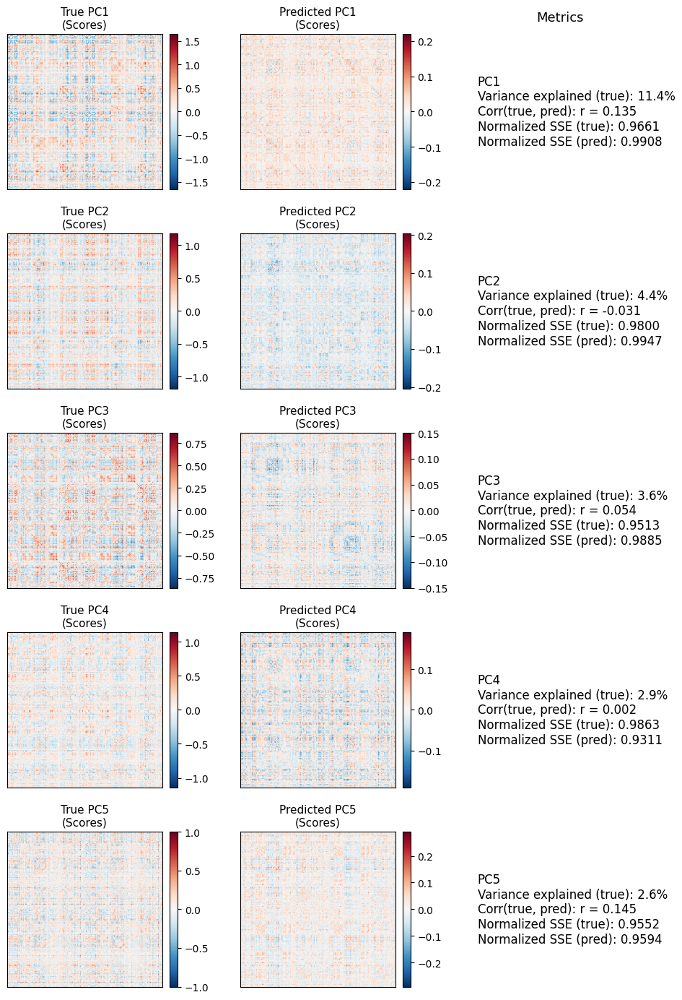

shape of C_true_scores:  (64620, 195)
shape of C_pred_scores:  (64620, 195)


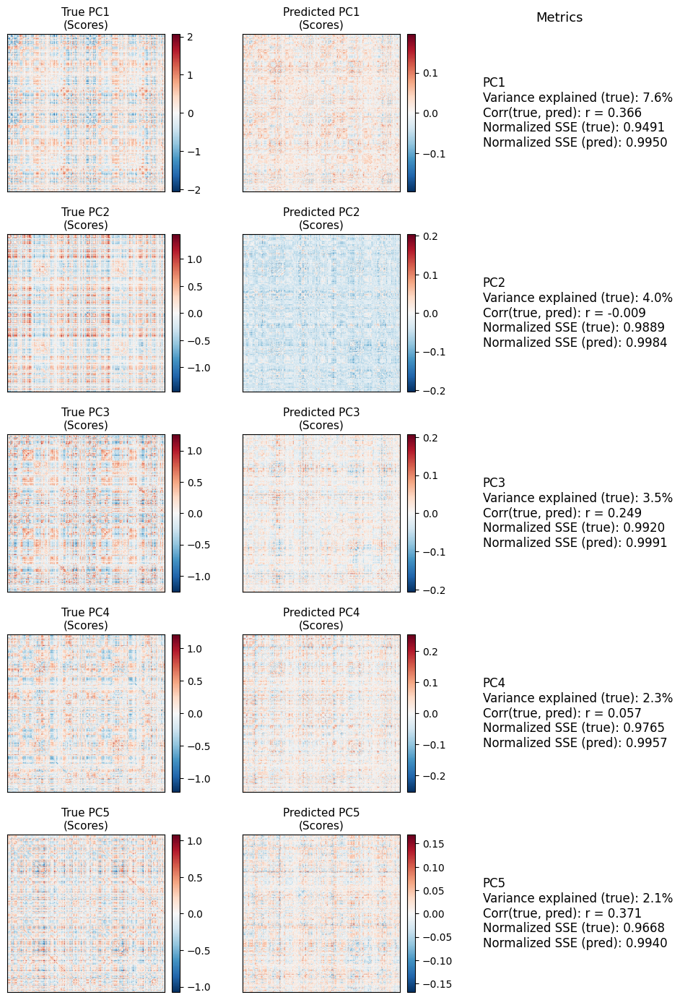

In [24]:
kraken_train_pca_preds, kraken_train_pca_targets = evaluate_pca_structure(
    preds=kraken_train_preds, 
    targets=train_targets, 
    train_mean=HCP_Dataset.fc_train_avg
)

plot_pc_modes_comparison(
    pca_preds=kraken_train_pca_preds, 
    pca_targets=kraken_train_pca_targets, 
    preds=kraken_train_preds, 
    targets=train_targets, 
    train_mean=HCP_Dataset.fc_train_avg, 
    numroi=360, 
    num_pcs=5, 
    diagval=0
)

kraken_val_pca_preds, kraken_val_pca_targets = evaluate_pca_structure(
    preds=kraken_val_preds, 
    targets=val_targets, 
    train_mean=HCP_Dataset.fc_train_avg
)

plot_pc_modes_comparison(
    pca_preds=kraken_val_pca_preds, 
    pca_targets=kraken_val_pca_targets, 
    preds=kraken_val_preds, 
    targets=val_targets, 
    train_mean=HCP_Dataset.fc_train_avg, 
    numroi=360, 
    num_pcs=5, 
    diagval=0
)

kraken_test_pca_preds, kraken_test_pca_targets = evaluate_pca_structure(
    preds=kraken_test_preds, 
    targets=test_targets, 
    train_mean=HCP_Dataset.fc_train_avg
)

plot_pc_modes_comparison(
    pca_preds=kraken_test_pca_preds, 
    pca_targets=kraken_test_pca_targets, 
    preds=kraken_test_preds, 
    targets=test_targets, 
    train_mean=HCP_Dataset.fc_train_avg, 
    numroi=360,
    num_pcs=5, 
    diagval=0
)